## First Model, Random Forest

### Using SFS

[link text](https://chatgpt.com/share/67fcd5c0-69e8-8006-945e-f5df6de64306)

In [ ]:
RF1FSFX_train = X_train[FSF]

In [ ]:
FSFrf = RandomForestClassifier(n_estimators=100, criterion='entropy', max_depth=5, random_state=42)
FSFrf.fit(RF1FSFX_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=5, random_state=42)

In [ ]:
RF1FSFX_test = X_test[FSF]

### Evaluation

Precision: 0.99
Recall: 0.95
F1 Score: 0.97

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97     56863
           1       0.99      0.95      0.97     56863

    accuracy                           0.97    113726
   macro avg       0.97      0.97      0.97    113726
weighted avg       0.97      0.97      0.97    113726



/tmp/ipykernel_34531/3060438044.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=labels, y=metrics, palette='viridis')


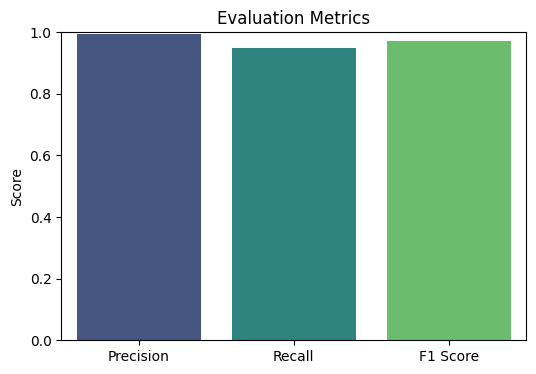

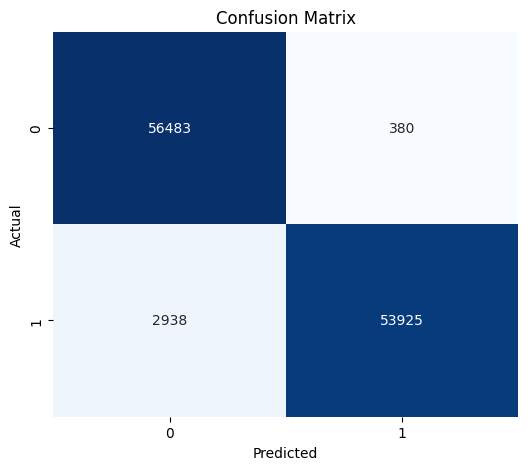

In [ ]:


# Predictions
RF1y_pred = FSFrf.predict(RF1FSFX_test)

# Scores
precision = precision_score(y_test, RF1y_pred)
recall = recall_score(y_test, RF1y_pred)
f1 = f1_score(y_test, RF1y_pred)

# Print scores
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print("\nClassification Report:\n", classification_report(y_test, RF1y_pred))

# Plot bar chart of metrics
plt.figure(figsize=(6, 4))
metrics = [precision, recall, f1]
labels = ['Precision', 'Recall', 'F1 Score']
sns.barplot(x=labels, y=metrics, palette='viridis')
plt.ylim(0, 1)
plt.title('Evaluation Metrics')
plt.ylabel('Score')
plt.show()

# Plot confusion matrix
cm = confusion_matrix(y_test, RF1y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


### Explaination

#### SFS explain

In [ ]:
importances = FSFrf.feature_importances_

# Create a DataFrame for sorting and display
feature_importance_df = pd.DataFrame({
    'Feature': RF1FSFX_train.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Print top N features
print(feature_importance_df.head(10))

  Feature  Importance
7     V14    0.370497
4     V10    0.200511
6     V12    0.138685
9     V17    0.116796
2      V4    0.105681
5     V11    0.027514
1      V3    0.017889
8     V16    0.015950
3      V9    0.004244
0      V2    0.002233


<Figure size 1500x1000 with 0 Axes>

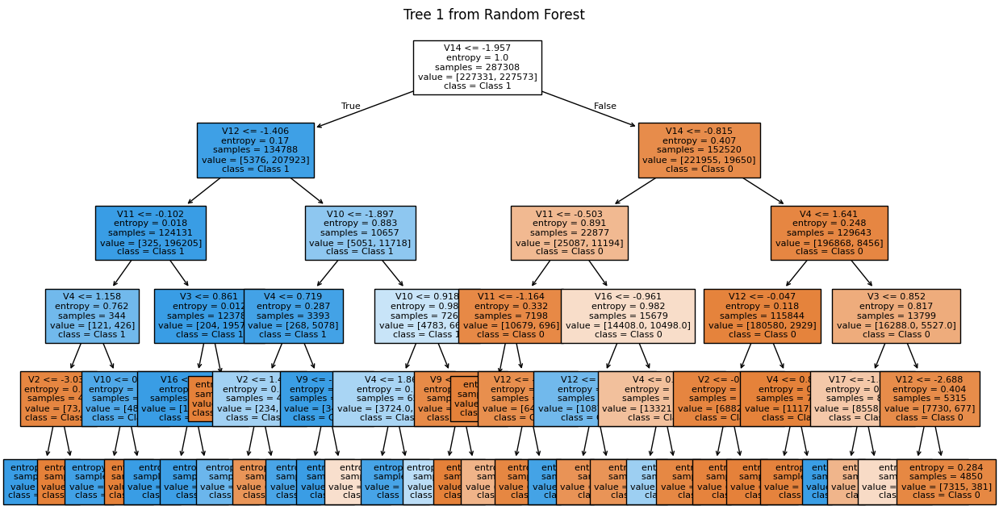

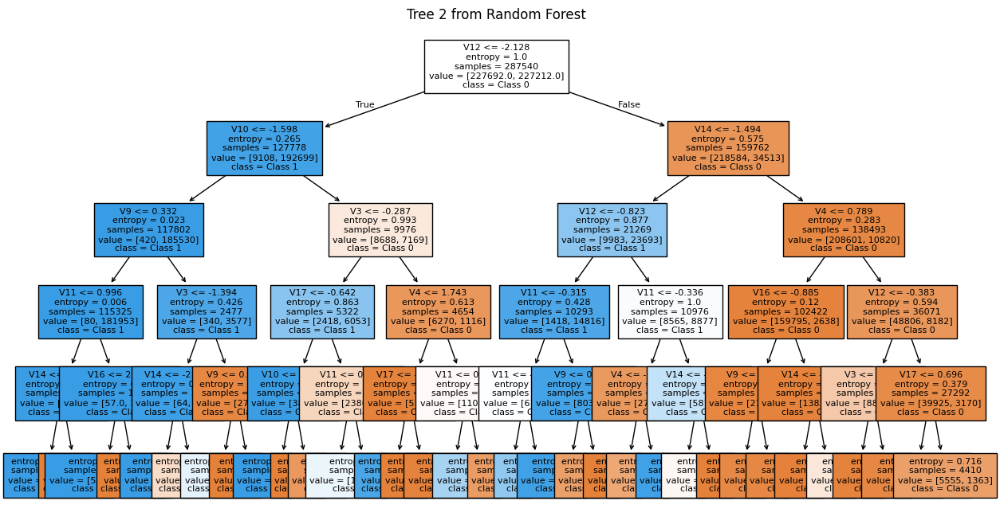

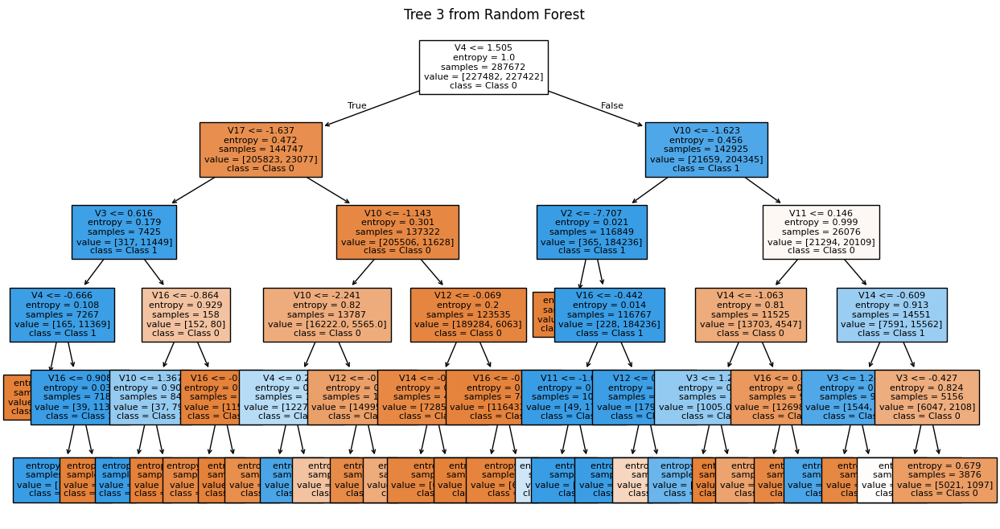

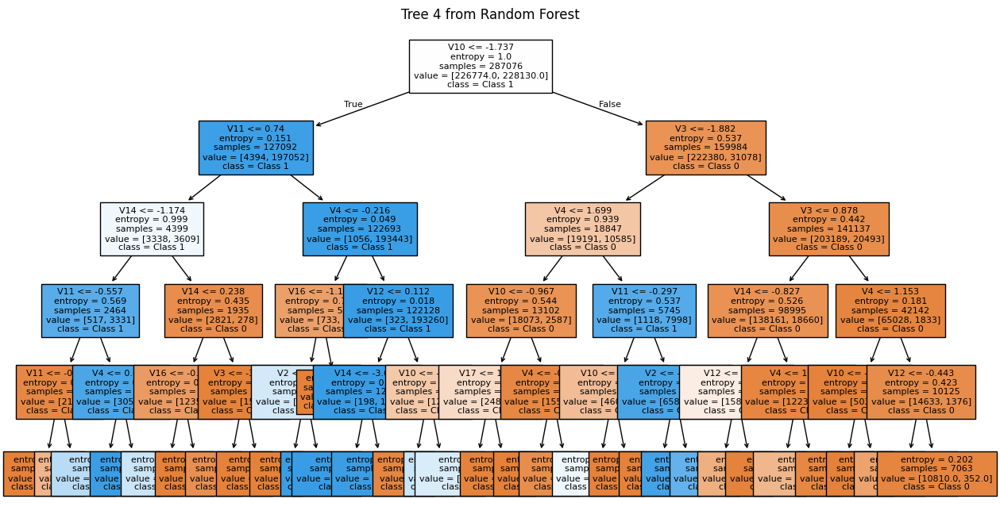

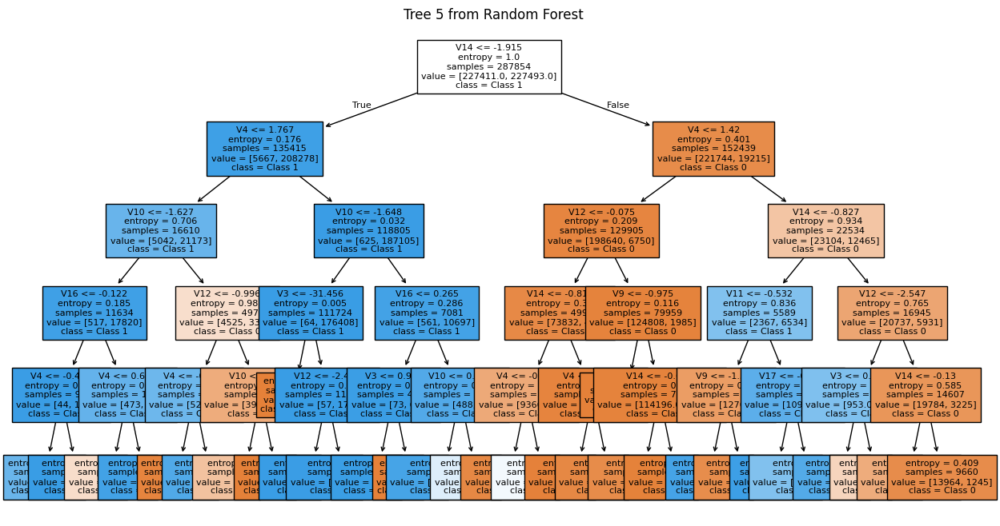

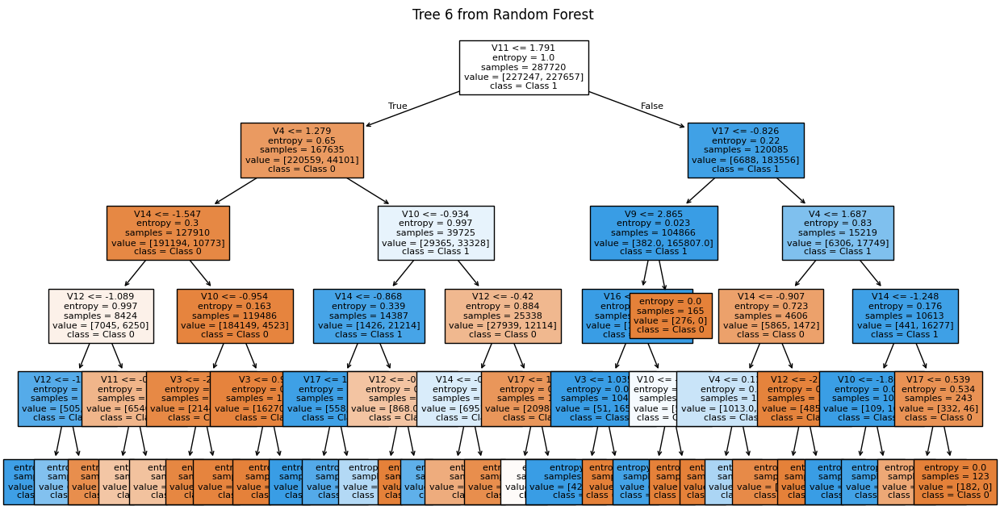

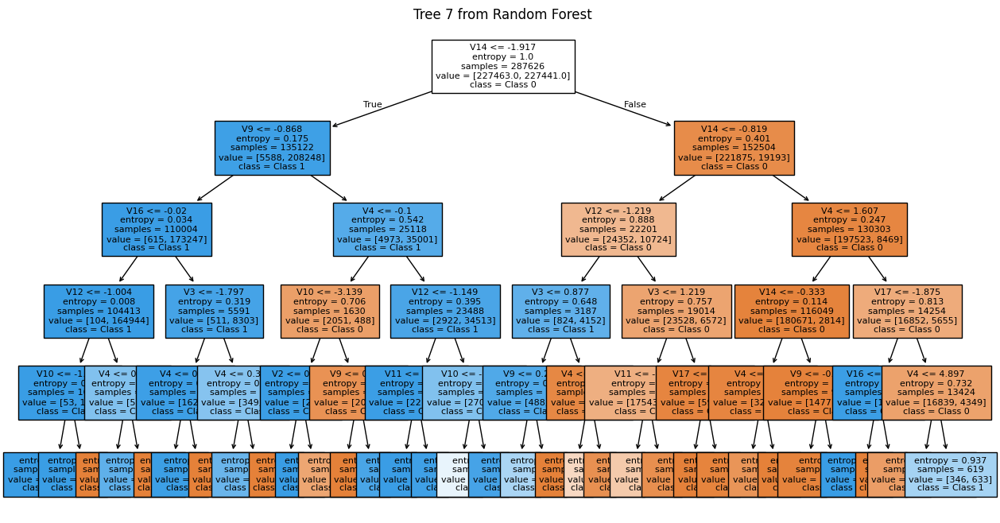

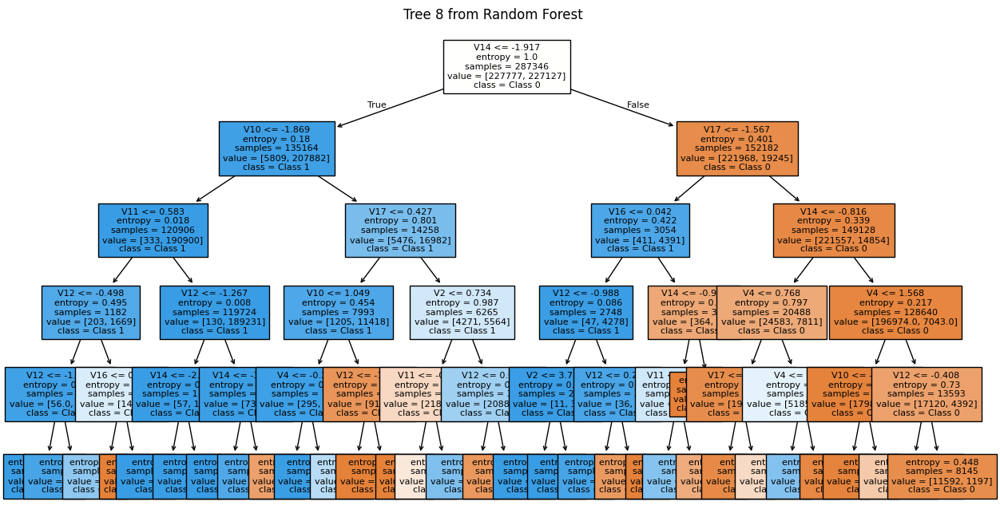

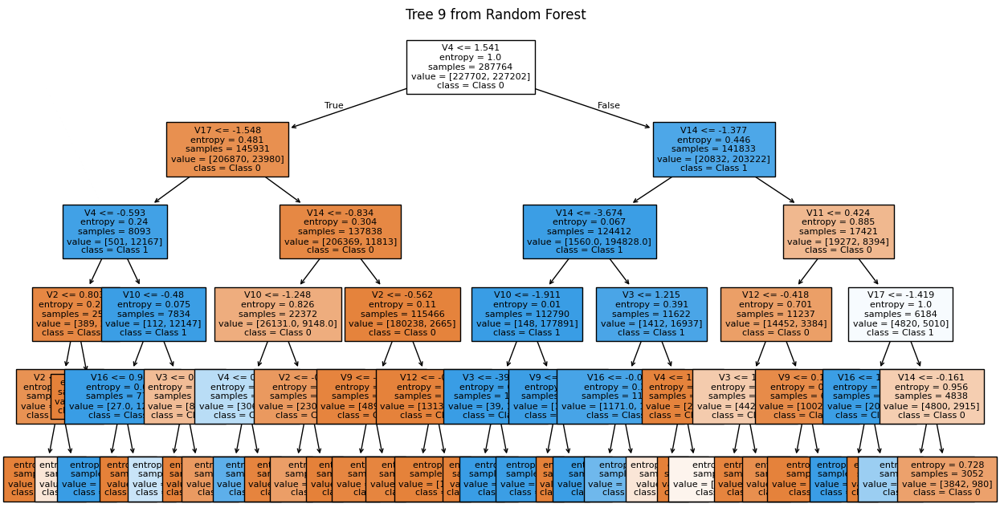

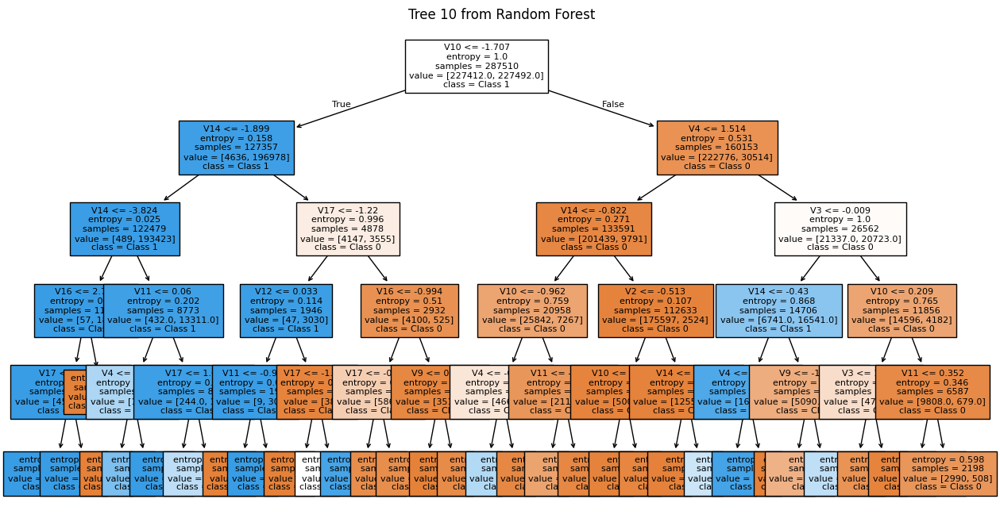

In [ ]:
num_trees_to_plot = 10  # Change this to visualize more trees

plt.figure(figsize=(15, 10))

for i in range(num_trees_to_plot):
    plt.figure(figsize=(15, 8))
    plot_tree(FSFrf.estimators_[i],
              filled=True,
              feature_names=RF1FSFX_train.columns,
              class_names=["Class 0", "Class 1"],
              fontsize=8)
    plt.title(f"Tree {i+1} from Random Forest")
    plt.show()

#### Lime

In [ ]:
# pip install lime


In [ ]:
explainer = LimeTabularExplainer(
    training_data=np.array(RF1FSFX_train),
    feature_names=RF1FSFX_train.columns,
    class_names=[0,1],  # Adjust based on your task
    mode='classification'
)

In [ ]:
# Explain one prediction
i = 0
exp = explainer.explain_instance(RF1FSFX_test.iloc[i].values, FSFrf.predict_proba, num_features=10)

/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
with open('lime_explanation_Random Forest.html', 'w') as f:
    f.write(exp.as_html())

#### shape

V2: 0.002232667571199883
V3: 0.017888866527732153
V4: 0.10568141141263133
V9: 0.004243843350981733
V10: 0.2005106297589565
V11: 0.027514328928879256
V12: 0.13868454562105956
V14: 0.37049749412034516
V16: 0.015950138210738877
V17: 0.11679607449747553


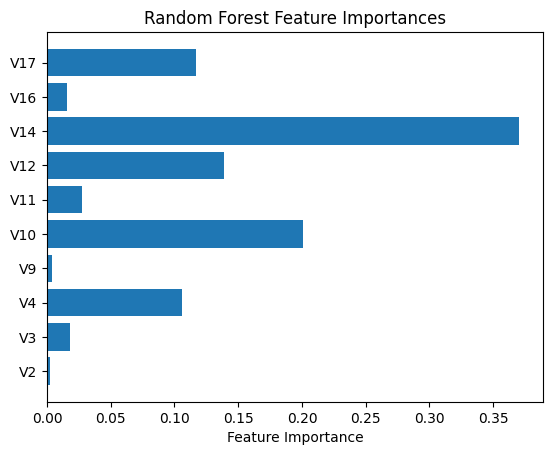

In [ ]:
importances = FSFrf.feature_importances_
features = RF1FSFX_test.columns

# Print non-zero importance features
for feat, imp in zip(features, importances):
    if imp > 0:
        print(f"{feat}: {imp}")

# Plot
plt.barh(features, importances)
plt.xlabel("Feature Importance")
plt.title("Random Forest Feature Importances")
plt.show()


In [ ]:
explainer = shap.Explainer(FSFrf.predict, RF1FSFX_test[:5000])
shap_values = explainer(RF1FSFX_test[:5000])

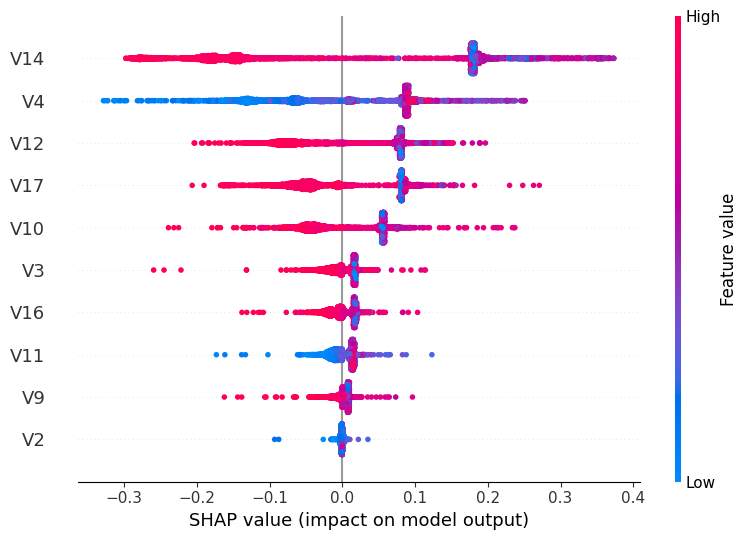

In [ ]:
shap.summary_plot(shap_values, RF1FSFX_test[:5000])

#### ALE

In [ ]:
M1proba_fun_rf = lambda x: FSFrf.predict_proba(x)


In [ ]:
M1proba_ale = ALE(M1proba_fun_rf, feature_names=FSF, target_names=[0,1])

In [ ]:
M1explanation_proba = M1proba_ale.explain(RF1FSFX_test.to_numpy())

/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifi

array([[<Axes: xlabel='V2', ylabel='ALE'>,
        <Axes: xlabel='V3', ylabel='ALE'>,
        <Axes: xlabel='V4', ylabel='ALE'>],
       [<Axes: xlabel='V9', ylabel='ALE'>,
        <Axes: xlabel='V10', ylabel='ALE'>,
        <Axes: xlabel='V11', ylabel='ALE'>],
       [<Axes: xlabel='V12', ylabel='ALE'>,
        <Axes: xlabel='V14', ylabel='ALE'>,
        <Axes: xlabel='V16', ylabel='ALE'>],
       [<Axes: xlabel='V17', ylabel='ALE'>, None, None]], dtype=object)

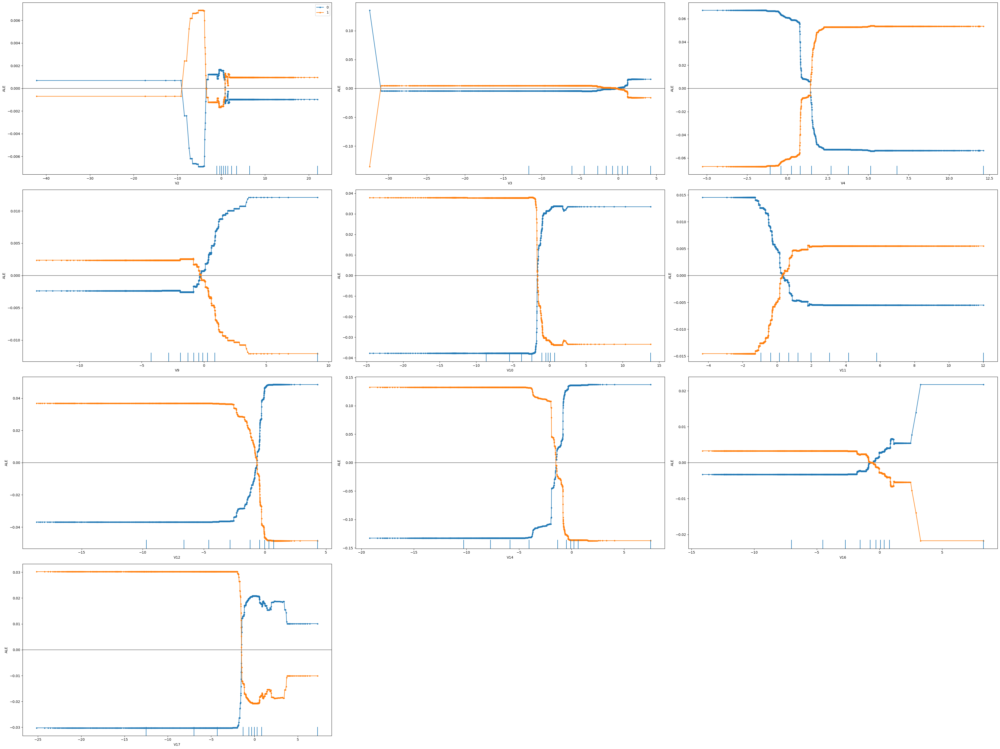

In [ ]:
plot_ale(M1explanation_proba, fig_kw={'figwidth': 40, 'figheight': 30}, sharey=None)

#### ICE

ValueError: All entries of features must be less than len(feature_names) = 10, got 10.

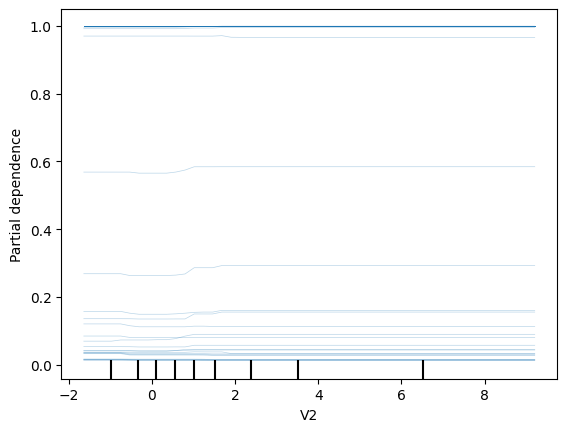

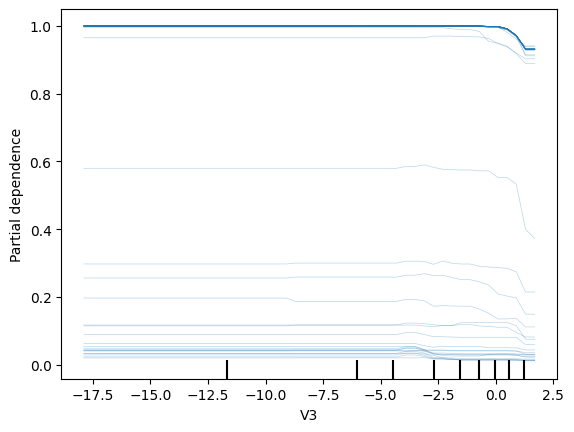

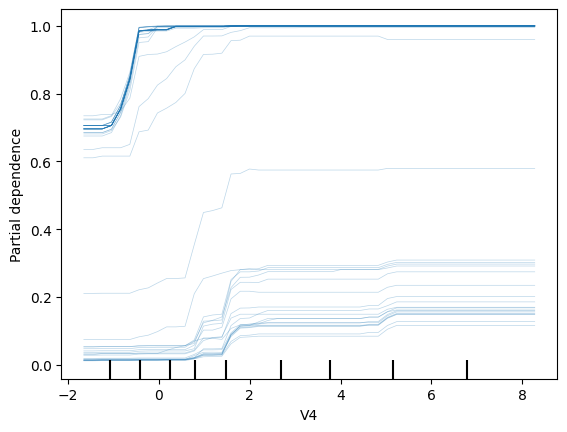

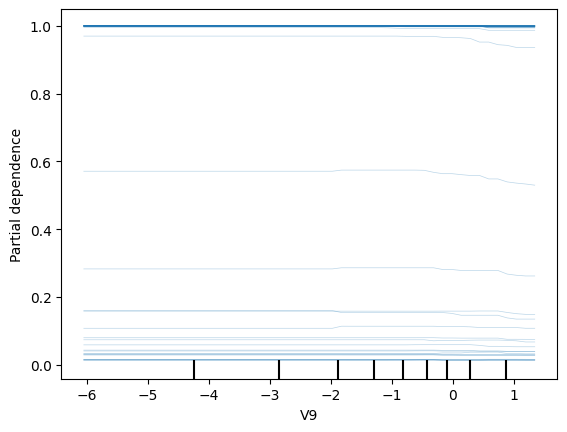

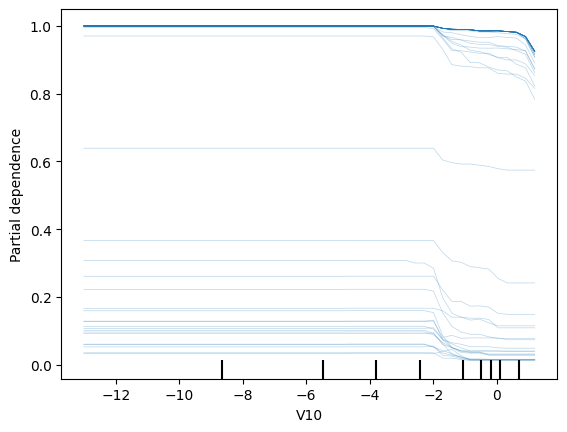

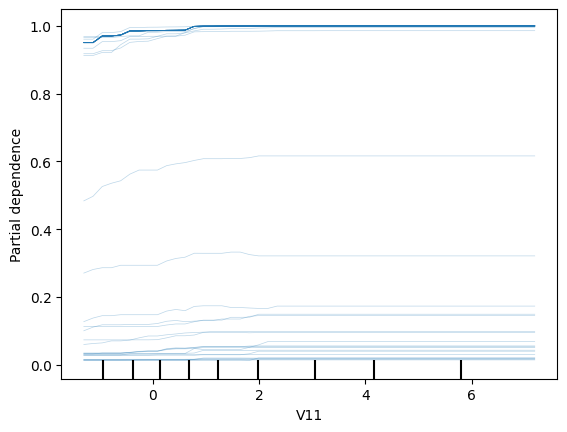

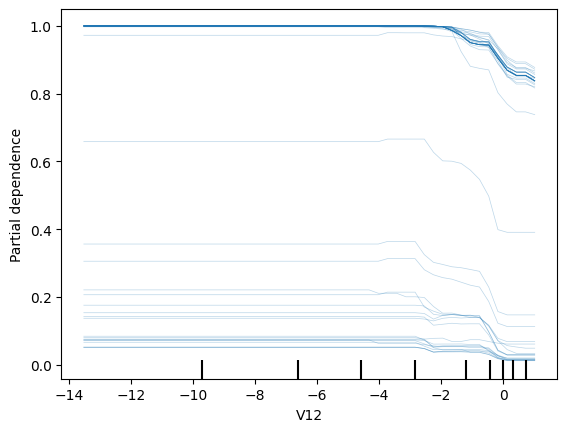

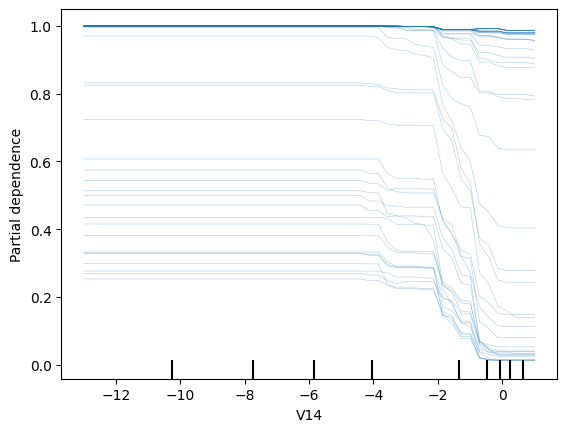

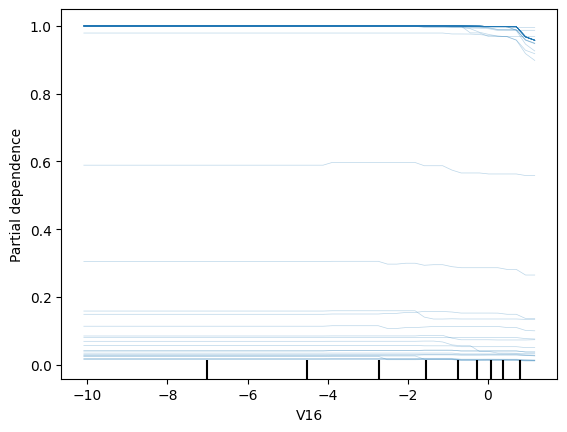

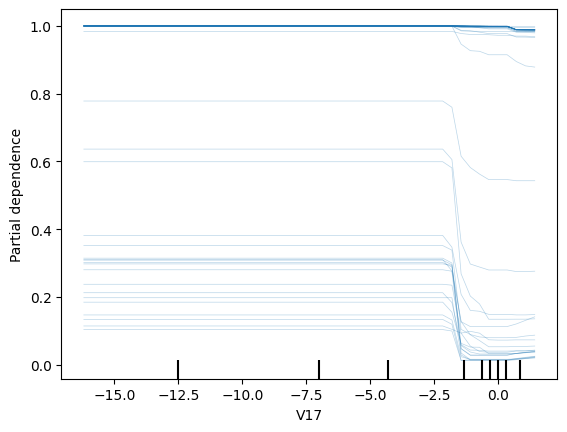

In [ ]:
for i in range(len(RF1FSFX_test)):
    PartialDependenceDisplay.from_estimator(
        estimator=FSFrf,
        X=RF1FSFX_test,
        features=[i],
        kind = "individual",
        grid_resolution=50,
        subsample=50,
        random_state=42
    )

### Using RFF

In [ ]:
RFFX_train = X_train[RFF]

In [ ]:
RFFrf = RandomForestClassifier(n_estimators=100, criterion='entropy', max_depth=5, random_state=42)
RFFrf.fit(RFFX_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=5, random_state=42)

In [ ]:
RFFX_test = X_test[RFF]

Precision: 0.99
Recall: 0.95
F1 Score: 0.97

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97     56863
           1       0.99      0.95      0.97     56863

    accuracy                           0.97    113726
   macro avg       0.97      0.97      0.97    113726
weighted avg       0.97      0.97      0.97    113726



<ipython-input-40-ac0fb3aab614>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=labels, y=metrics, palette='viridis')


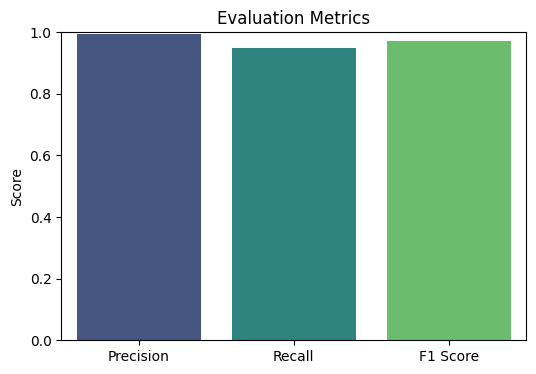

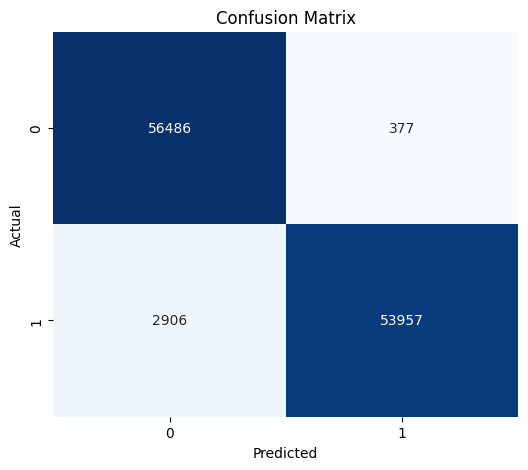

In [ ]:


# Predictions
y_pred = RFFrf.predict(RFFX_test)

# Scores
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print scores
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Plot bar chart of metrics
plt.figure(figsize=(6, 4))
metrics = [precision, recall, f1]
labels = ['Precision', 'Recall', 'F1 Score']
sns.barplot(x=labels, y=metrics, palette='viridis')
plt.ylim(0, 1)
plt.title('Evaluation Metrics')
plt.ylabel('Score')
plt.show()

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


#### RF Explanation

In [ ]:
importances = RFFrf.feature_importances_

# Create a DataFrame for sorting and display
feature_importance_df = pd.DataFrame({
    'Feature': RFFX_train.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Print top N features
print(feature_importance_df.head(10))

  Feature  Importance
5     V14    0.338776
1     V10    0.198203
3     V12    0.161231
7     V17    0.119362
0      V4    0.103578
2     V11    0.045706
6     V16    0.023222
8     V27    0.003949
9     V28    0.003502
4     V13    0.002471


<Figure size 1500x1000 with 0 Axes>

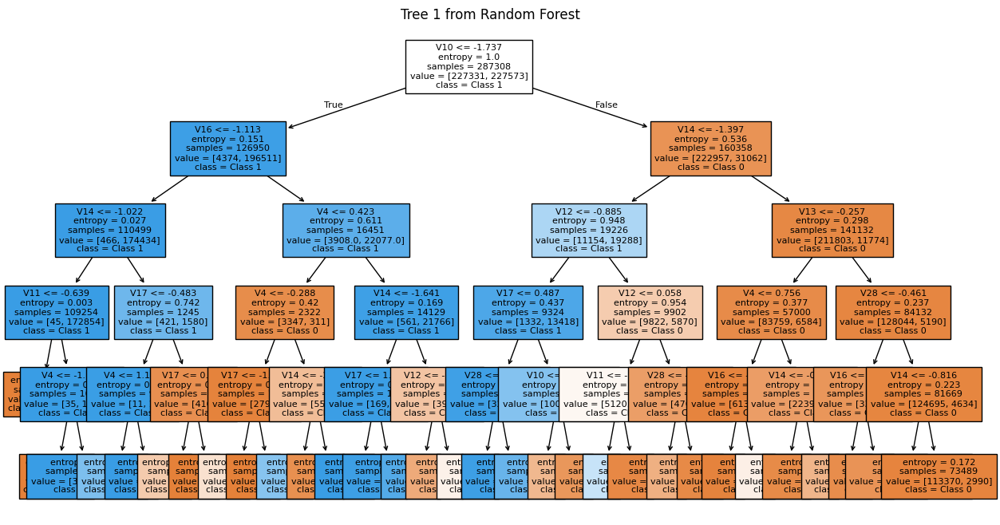

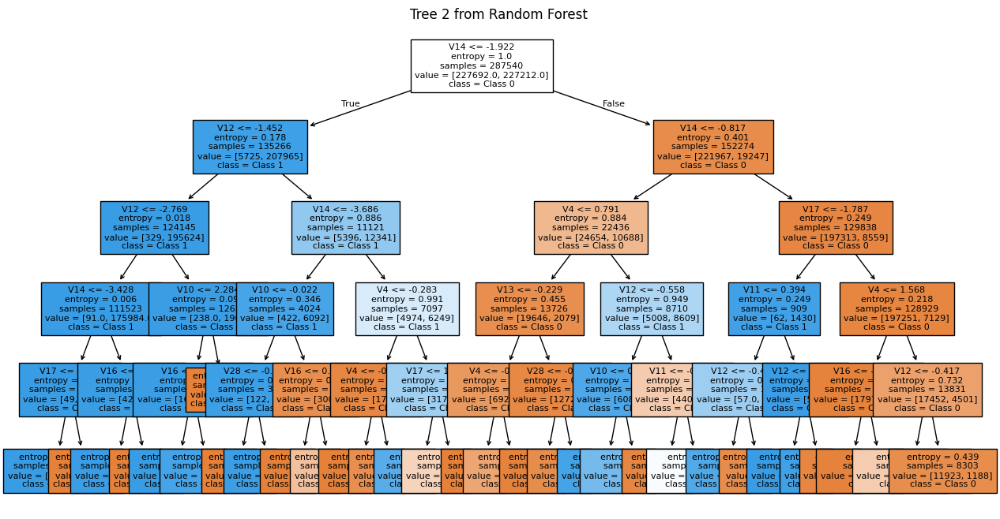

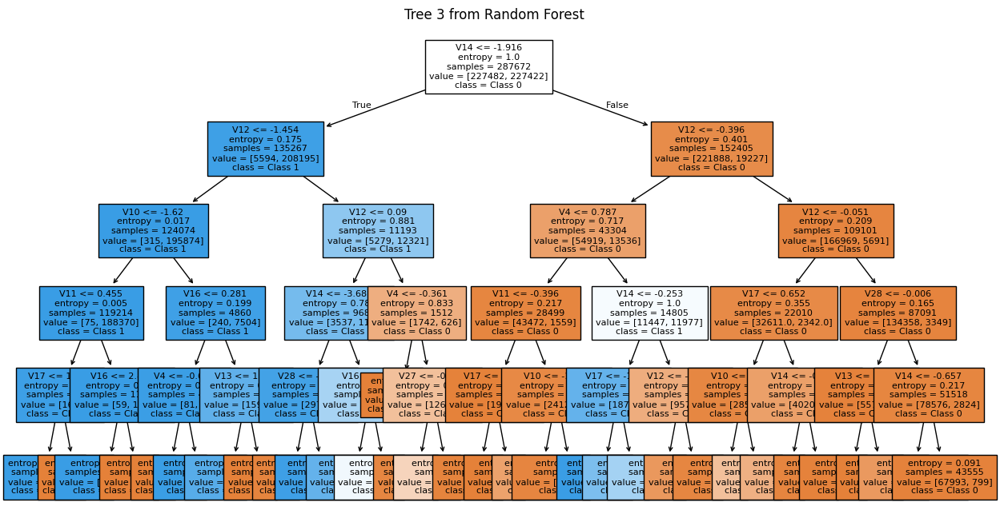

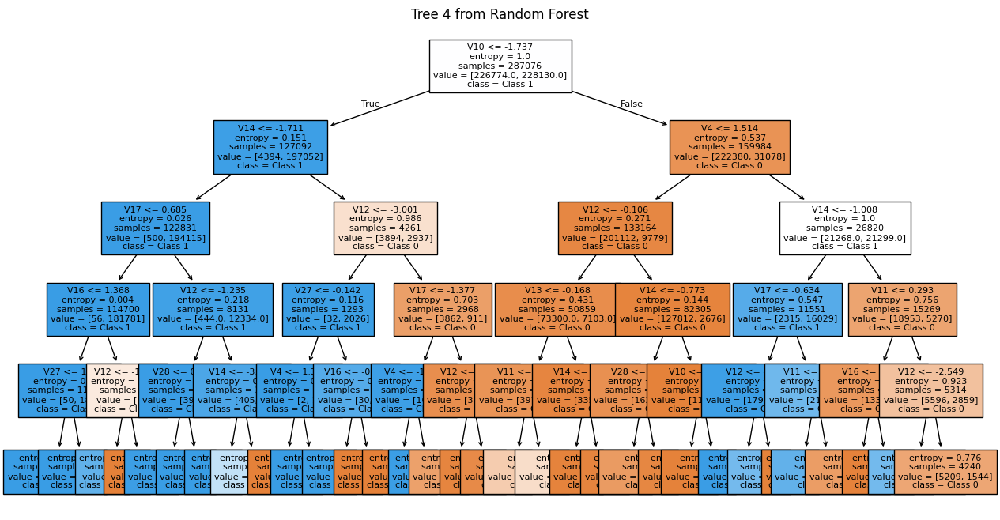

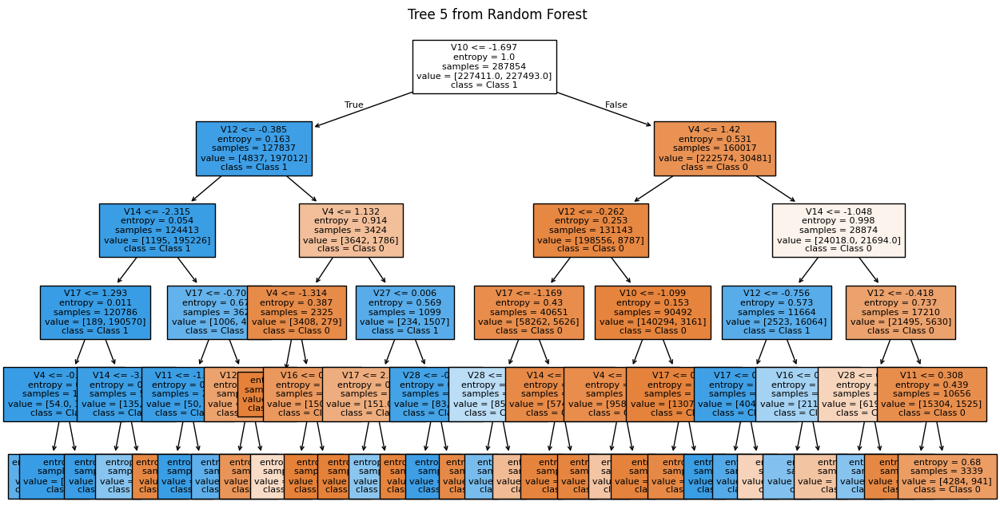

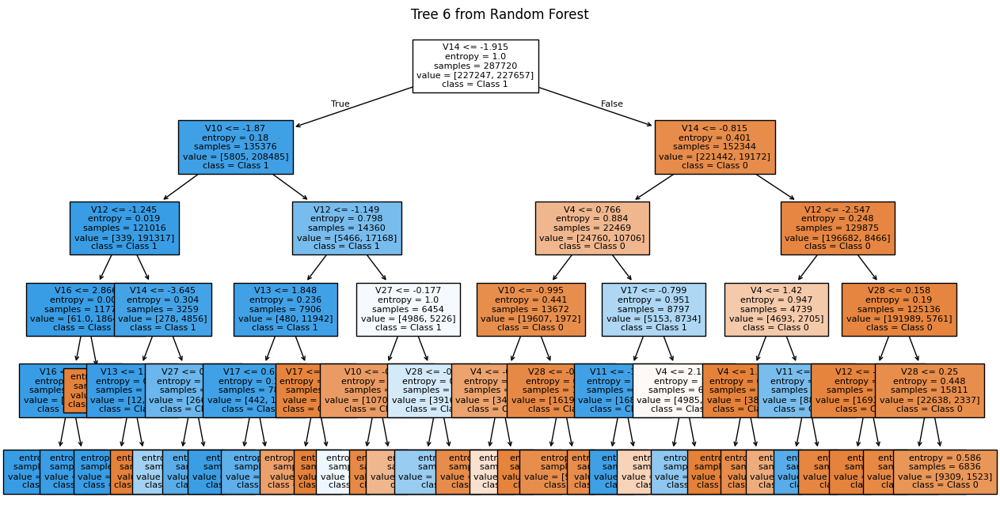

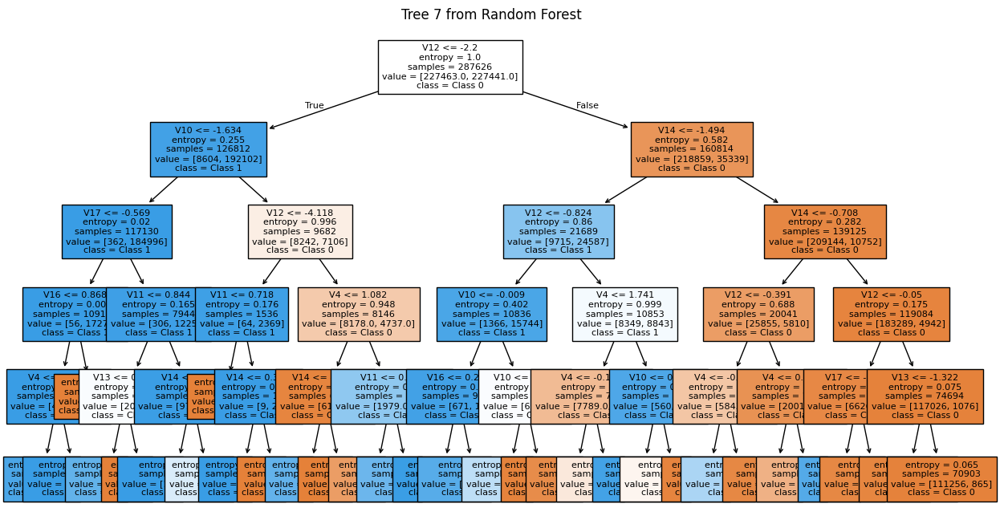

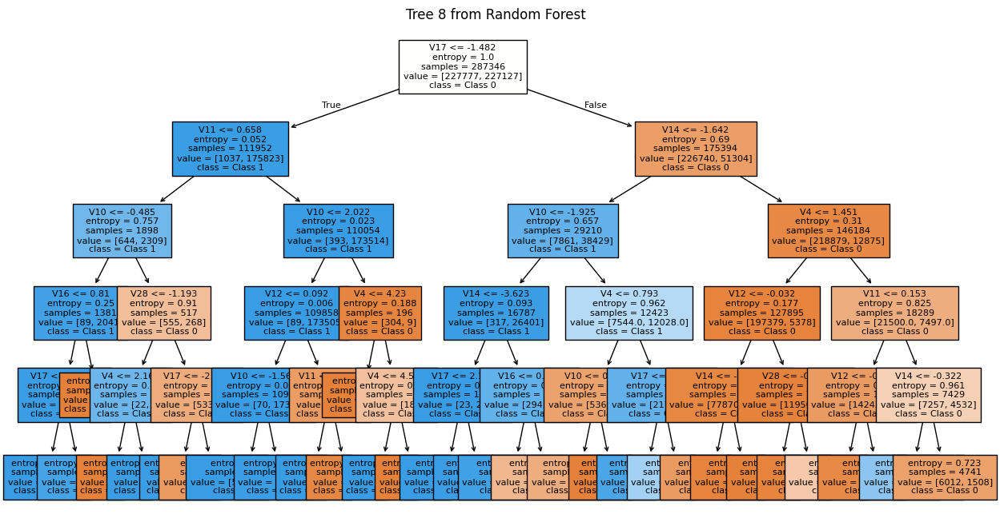

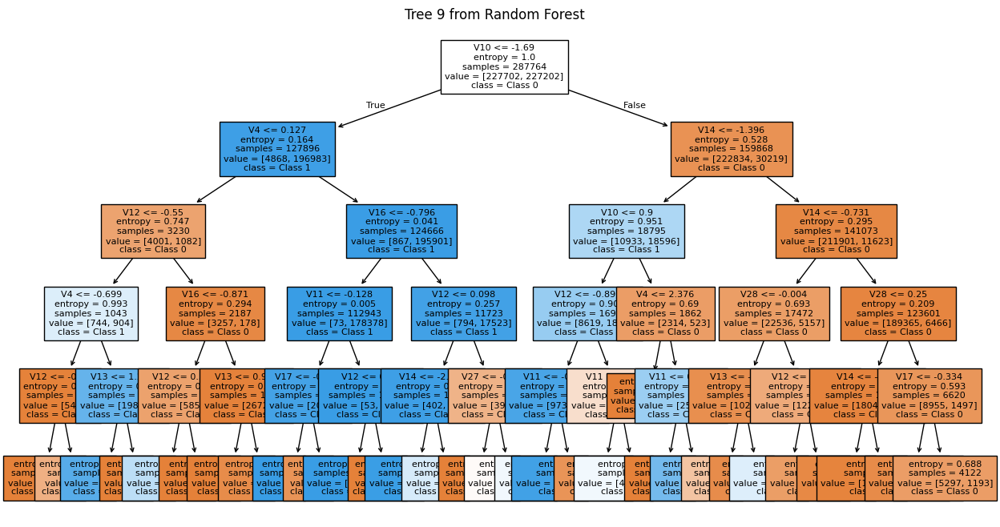

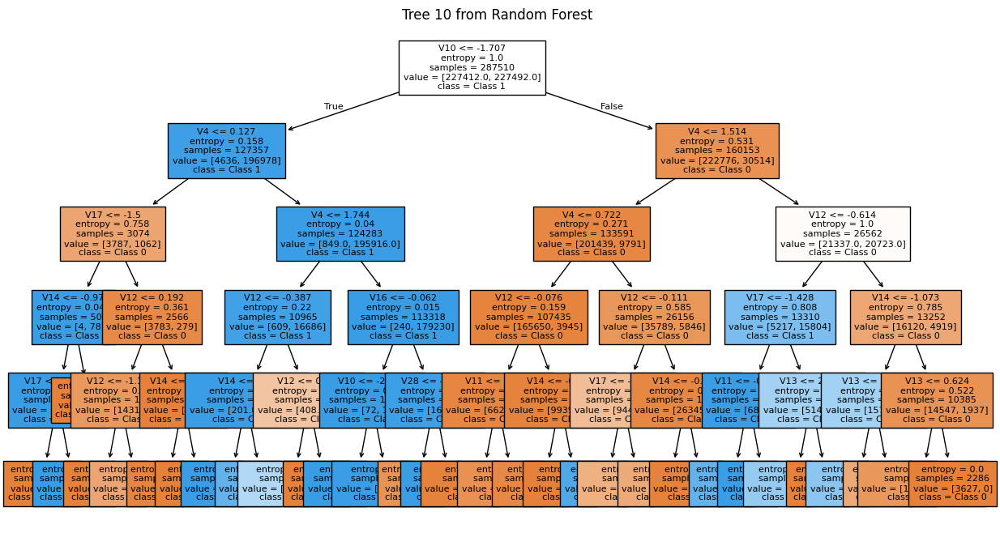

In [ ]:
num_trees_to_plot = 10  # Change this to visualize more trees

plt.figure(figsize=(15, 10))

for i in range(num_trees_to_plot):
    plt.figure(figsize=(15, 8))
    plot_tree(RFFrf.estimators_[i],
              filled=True,
              feature_names=RFFX_train.columns,
              class_names=["Class 0", "Class 1"],
              fontsize=8)
    plt.title(f"Tree {i+1} from Random Forest")
    plt.show()

### Using RFSM

[link text](https://chatgpt.com/share/67fcd5c0-69e8-8006-945e-f5df6de64306)

In [ ]:
RFSMX_train = X_train[RFSM]

In [ ]:
RFSMrf = RandomForestClassifier(n_estimators=100, criterion='entropy', max_depth=5, random_state=42)
RFSMrf.fit(RFSMX_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=5, random_state=42)

In [ ]:
RFSMX_test = X_test[RFSM]

Precision: 0.99
Recall: 0.94
F1 Score: 0.97

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.99      0.97     56863
           1       0.99      0.94      0.97     56863

    accuracy                           0.97    113726
   macro avg       0.97      0.97      0.97    113726
weighted avg       0.97      0.97      0.97    113726



<ipython-input-51-dd4220ca2010>:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=labels, y=metrics, palette='viridis')


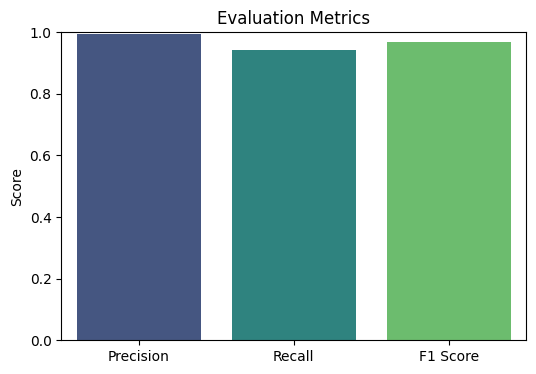

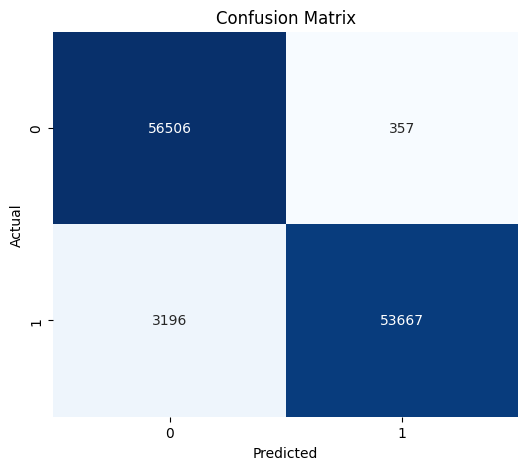

In [ ]:
# Predictions
y_pred = RFSMrf.predict(RFSMX_test)

# Scores
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print scores
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Plot bar chart of metrics
plt.figure(figsize=(6, 4))
metrics = [precision, recall, f1]
labels = ['Precision', 'Recall', 'F1 Score']
sns.barplot(x=labels, y=metrics, palette='viridis')
plt.ylim(0, 1)
plt.title('Evaluation Metrics')
plt.ylabel('Score')
plt.show()

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


#### RFSM explain

In [ ]:
importances = RFSMrf.feature_importances_

# Create a DataFrame for sorting and display
feature_importance_df = pd.DataFrame({
    'Feature': RFSMX_train.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Print top N features
print(feature_importance_df.head(10))

   Feature  Importance
10     V14    0.271480
9      V12    0.153779
7      V10    0.142381
12     V17    0.108982
3       V4    0.095568
8      V11    0.068336
2       V3    0.059594
5       V7    0.027720
1       V2    0.025991
11     V16    0.023777


<Figure size 1500x1000 with 0 Axes>

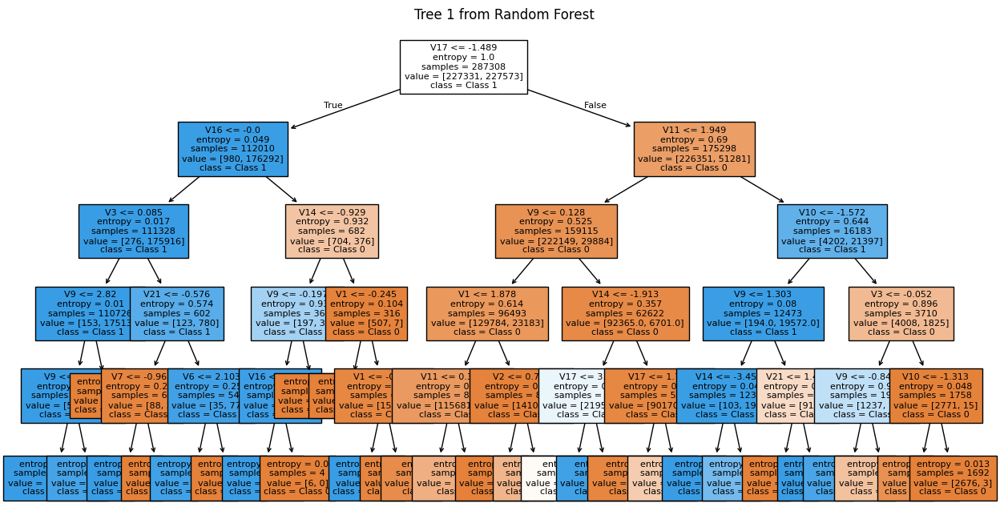

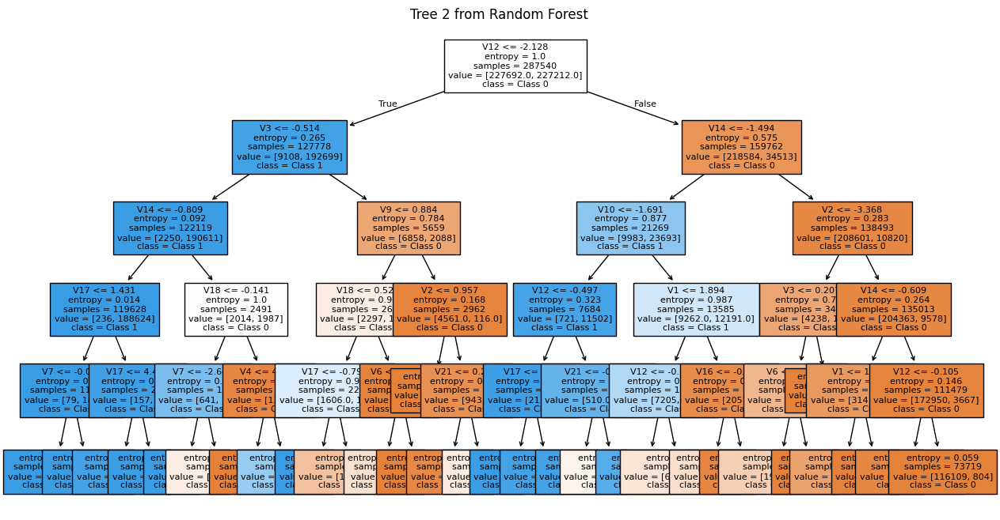

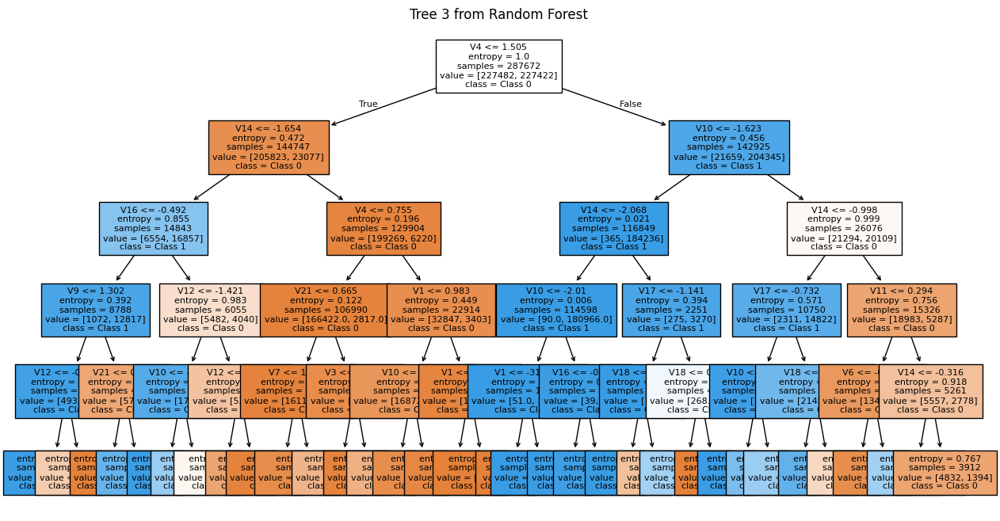

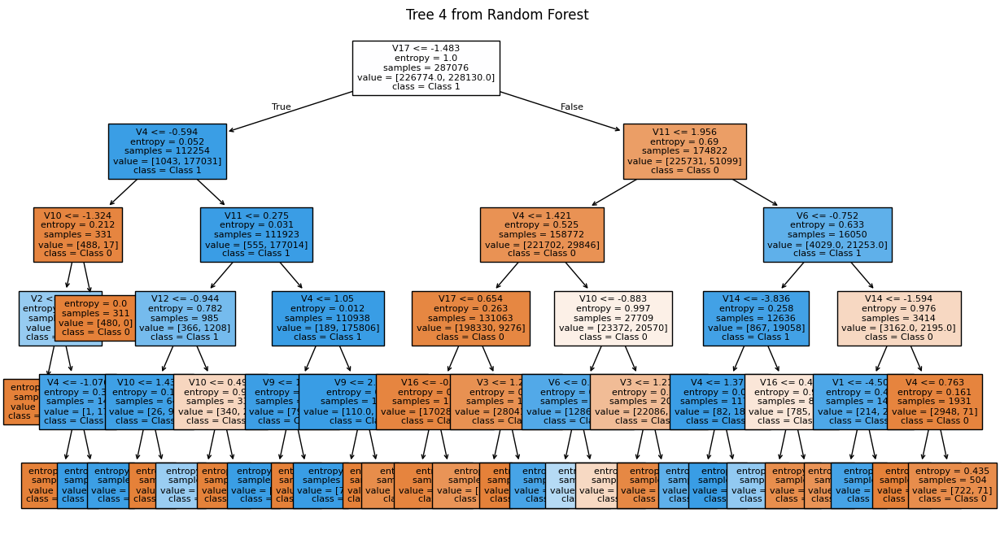

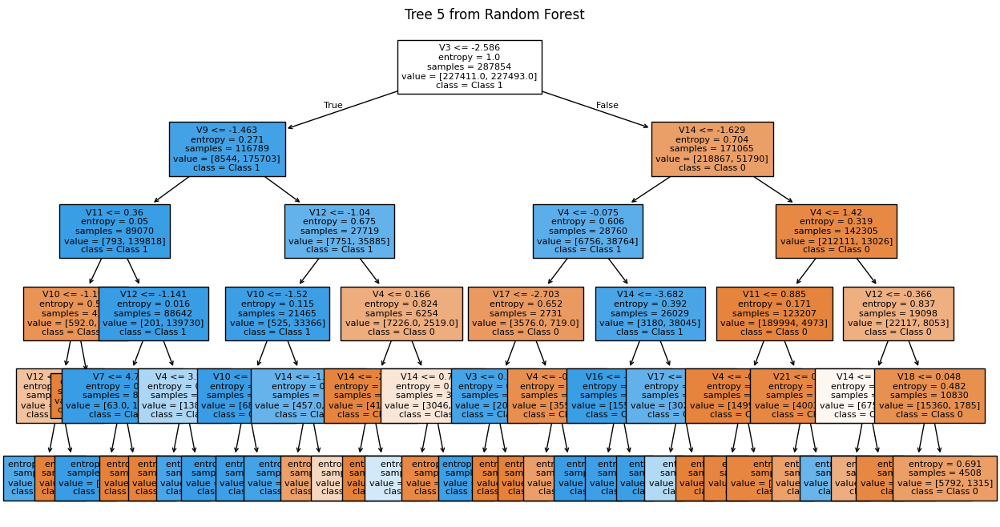

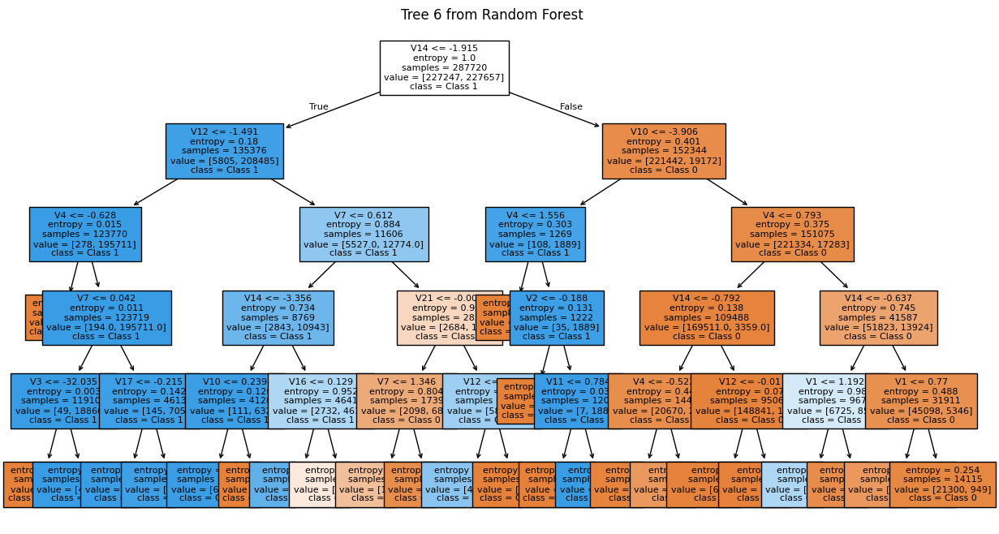

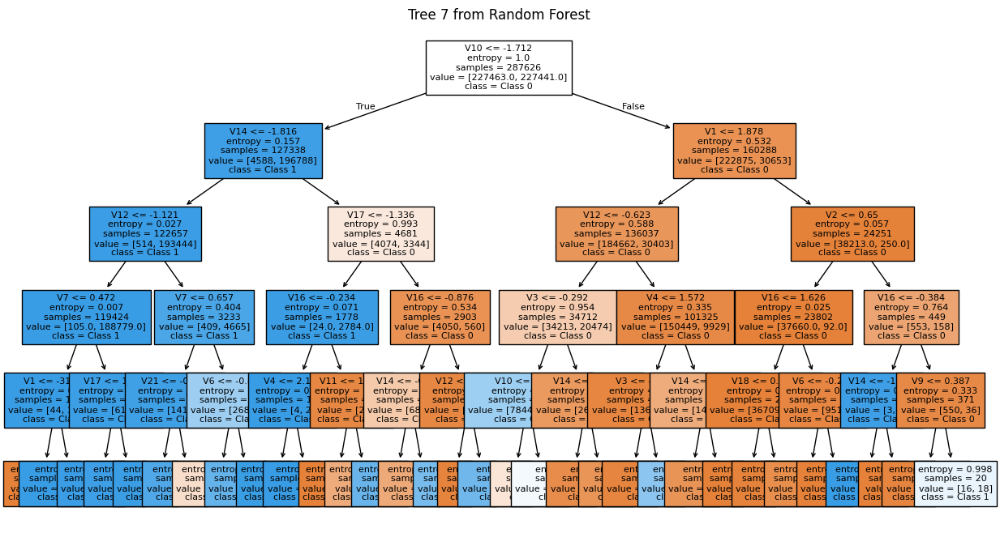

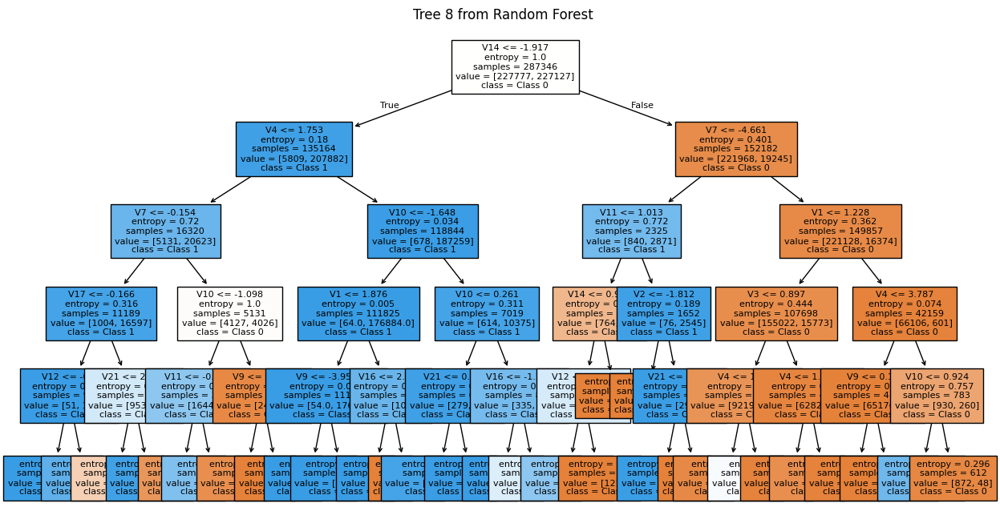

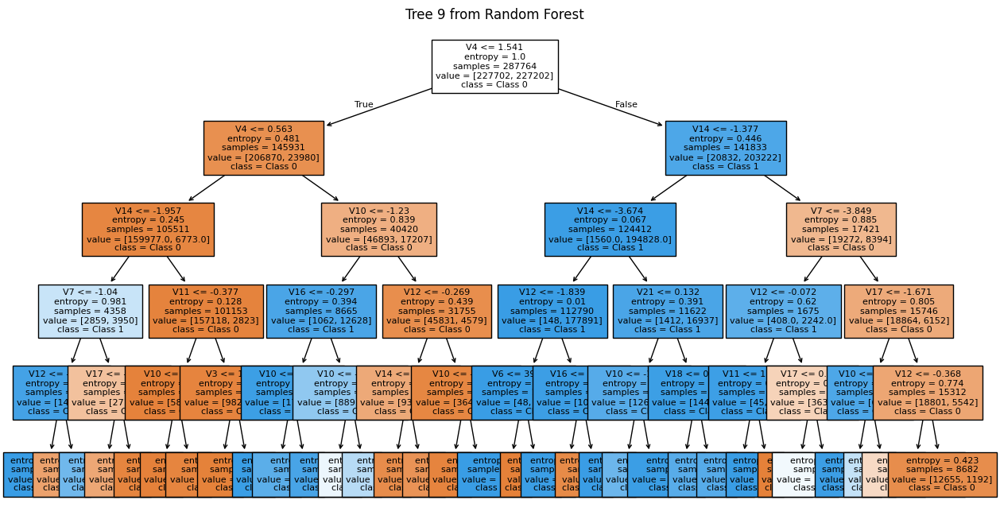

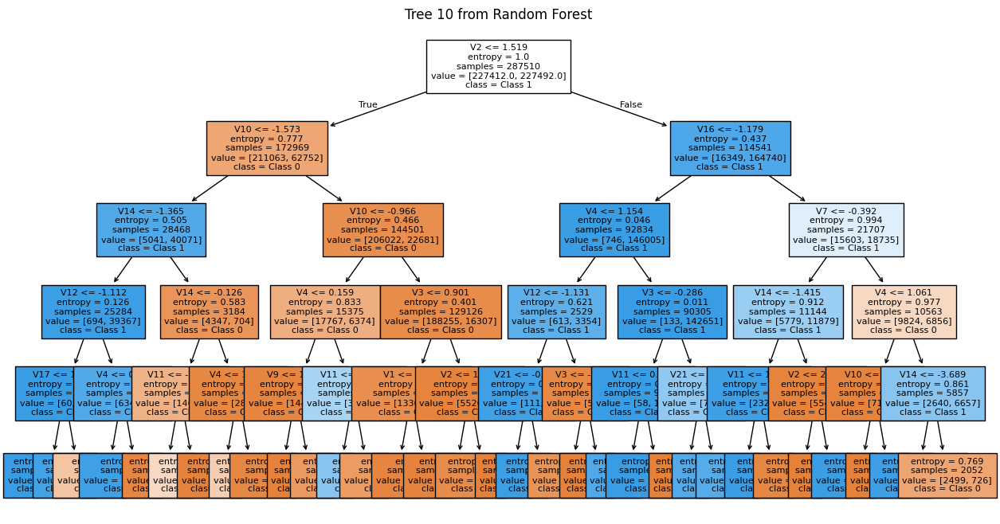

In [ ]:
num_trees_to_plot = 10  # Change this to visualize more trees

plt.figure(figsize=(15, 10))

for i in range(num_trees_to_plot):
    plt.figure(figsize=(15, 8))
    plot_tree(RFSMrf.estimators_[i],
              filled=True,
              feature_names=RFSMX_train.columns,
              class_names=["Class 0", "Class 1"],
              fontsize=8)
    plt.title(f"Tree {i+1} from Random Forest")
    plt.show()